In [18]:
import json
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict, OrderedDict
from enum import Enum


In [19]:
class Field(Enum):
    content = "content"
    MIC = "MIC"
    DevAddr = "DevAddr"
    upinfo = "upinfo"
    xtime = "xtime"
    rxtime = "rxtime"

# Extract any property for all address

In [14]:
def extract_for_all_devaddr(input_file, property_name):
    with open(input_file, 'r') as f:
        data = json.load(f)
    
    devaddr_values = defaultdict(list)
    
    if isinstance(data, list):
        for item in data:
            if Field.content.value in item:
                devaddr = item[Field.content.value].get(Field.DevAddr.value)
                if devaddr is not None:
                    if property_name in item[Field.content.value]:
                        devaddr_values[devaddr].append(item[Field.content.value][property_name])
                    elif Field.upinfo.value in item[Field.content.value] and property_name in item[Field.content.value][Field.upinfo.value]:
                        devaddr_values[devaddr].append(item[Field.content.value][Field.upinfo.value][property_name])
    else:
        print('please provide an array')

    sorted_devaddr_values = OrderedDict(sorted(devaddr_values.items()))
    return sorted_devaddr_values


# Extract all xtime and rxtime for each devAddr

In [4]:
def extract_xtime_rxtime(input_file):
    with open(input_file, 'r') as f:
        data = json.load(f)
    
    devaddr_values = defaultdict(list)
    
    if isinstance(data, list):
        for item in data:
            if Field.content.value in item:
                devaddr = item[Field.content.value].get(Field.DevAddr.value)
                if devaddr is not None and Field.upinfo.value in item[Field.content.value]:
                    xtime = item[Field.content.value][Field.upinfo.value].get(Field.xtime.value)
                    rxtime = item[Field.content.value][Field.upinfo.value].get(Field.rxtime.value)
                    if xtime is not None and rxtime is not None:
                        devaddr_values[devaddr].append({Field.xtime.value: xtime, Field.rxtime.value: rxtime})
    else:
        print('please provide an array')
        
    sorted_devaddr_values = OrderedDict(sorted(devaddr_values.items()))
    
    return sorted_devaddr_values


In [5]:
file = 'wss_messages.json'
# all_rxtime_by_devAdr= extract_for_all_devaddr(file, 'rxtime')
devaddr_values = extract_xtime_rxtime(file)
print(devaddr_values)


OrderedDict({-1946138055: [{'xtime': 55450632554943660, 'rxtime': 1719051864.200105}], 62754: [{'xtime': 29554887684631382, 'rxtime': 1718762001.304364}, {'xtime': 29554887690985445, 'rxtime': 1718762007.655446}, {'xtime': 52635834945092501, 'rxtime': 1718848397.227704}, {'xtime': 52635834950864637, 'rxtime': 1718848402.995512}, {'xtime': 55450601882315247, 'rxtime': 1719021191.591528}, {'xtime': 55450601888891243, 'rxtime': 1719021198.16508}, {'xtime': 41095378042504462, 'rxtime': 1719107594.478525}, {'xtime': 10696097517992966, 'rxtime': 1719280382.116516}, {'xtime': 10696097525189038, 'rxtime': 1719280389.316771}, {'xtime': 32369671138550545, 'rxtime': 1719366778.884863}, {'xtime': 32369671145525680, 'rxtime': 1719366785.861071}, {'xtime': 32369757535280525, 'rxtime': 1719453175.604819}, {'xtime': 32369757542153571, 'rxtime': 1719453182.47816}], 62755: [{'xtime': 47569302210283535, 'rxtime': 1718814883.241682}, {'xtime': 47569302217874678, 'rxtime': 1718814890.835016}, {'xtime': 323

# Export value to json

In [6]:
def save_to_json(val, output_file):
    output_data = {"devAddresses": val}
    with open(output_file, 'w') as f:
        json.dump(output_data, f, indent=4)

In [7]:
save_to_json(devaddr_values, 'times_by_devAddr.json')

# Plot the linear regression between xtime and rxtime

In [21]:
def plot_linear_regression(ax, devaddr, values):
    x = np.array([v[Field.xtime.value] for v in values])
    y = np.array([v[Field.rxtime.value] for v in values])

    # obtain m (slope) and b(intercept) of linear regression line
    m, b = np.polyfit(x, y, 1)

    # add linear regression line to scatterplot 
    ax.scatter(x, y, color='blue')
    ax.plot(x, m * x + b, color='red')
    ax.set_xlabel(Field.xtime.value)
    ax.set_ylabel(Field.rxtime.value)
    ax.set_title(devaddr)

def linear_regression(devaddr_values):
    # filter data to process only if >1
    filtered_devaddr_values = {devaddr: values for devaddr, values in devaddr_values.items() if len(values) > 1}
    
    num_devaddresses = len(filtered_devaddr_values)
    num_cols = 5
    num_rows = -(-num_devaddresses // num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 2))
    fig.suptitle(f'Linear regression for every device between {Field.xtime.value} and {Field.rxtime.value}')
    axes = axes.flatten()

    for idx, (devaddr, values) in enumerate(filtered_devaddr_values.items()):
        plot_linear_regression(axes[idx], devaddr, values)

    for i in range(len(filtered_devaddr_values), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(rect=[0, 0, 1, 0.98]) 
    plt.show()

# linear_regression(devaddr_values)


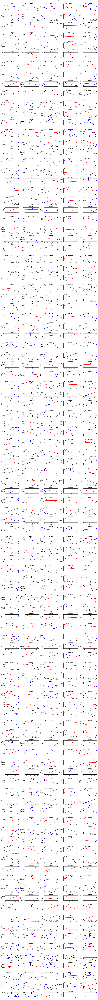

In [22]:
linear_regression(devaddr_values)
#print(regression_results)

# MIC bit level distribution 

In [10]:
mic_by_dev_addr = extract_for_all_devaddr('wss_messages.json', Field.MIC.value)

In [11]:
print(mic_by_dev_addr)

save_to_json(mic_by_dev_addr, 'toto.json')

OrderedDict({-1946138055: [-1365321978], 62754: [-1335598633, -1335598633, -988165648, -988165648, -752617375, -752617375, 1101218470, 407246818, 407246818, -1969057591, -1969057591, -1722134621, -1722134621], 62755: [1607295762, 1607295762, -2058949855], 62756: [655351232], 71292: [-1572298136, 670950284, -625764717, 325962695, -774854648, 1395504938, 1365166151, 728006447, 1586824722, 361303009, -862586686, -699125670, -1325219745, -185170771, -1457512916, -844042871, -1361293580, 682127202, -256226939, 406414373, 993412073, 876392674, 1821186649, 1860036489, 1998399146, 1930942559, 305066138, 2054464565, 1547974135, 406792686, 126000131, -1161366532, -596073534, -1286195465, -316557490, -2040104202, -1448797979, -1320711882, -236800080, -1465384409, 603778623, 258323563, 181233808, 1550312040, -1307513488, 1090504504, 118288522, -1933084892, 1412327014, -336819660, 2103632900, -1625811991, -210610187], 3333029: [-811137849, -1782288230, -881740010, 698765373, -516561573, -2032165531

In [12]:
import seaborn as sns

def plot_distribution(subplot, values, label_val):

    sns.histplot(values, kde=False, discrete=True, ax=subplot)
    subplot.set_title(f'{label_val}, {len(values)} packets')
    subplot.set_xlabel('Bit')
    subplot.set_ylabel('Frequency')
    subplot.set_xticks([0, 1])
    subplot.grid(True)

In [13]:
def extract_bit(value, bit_position):
    return (value >> bit_position) & 1

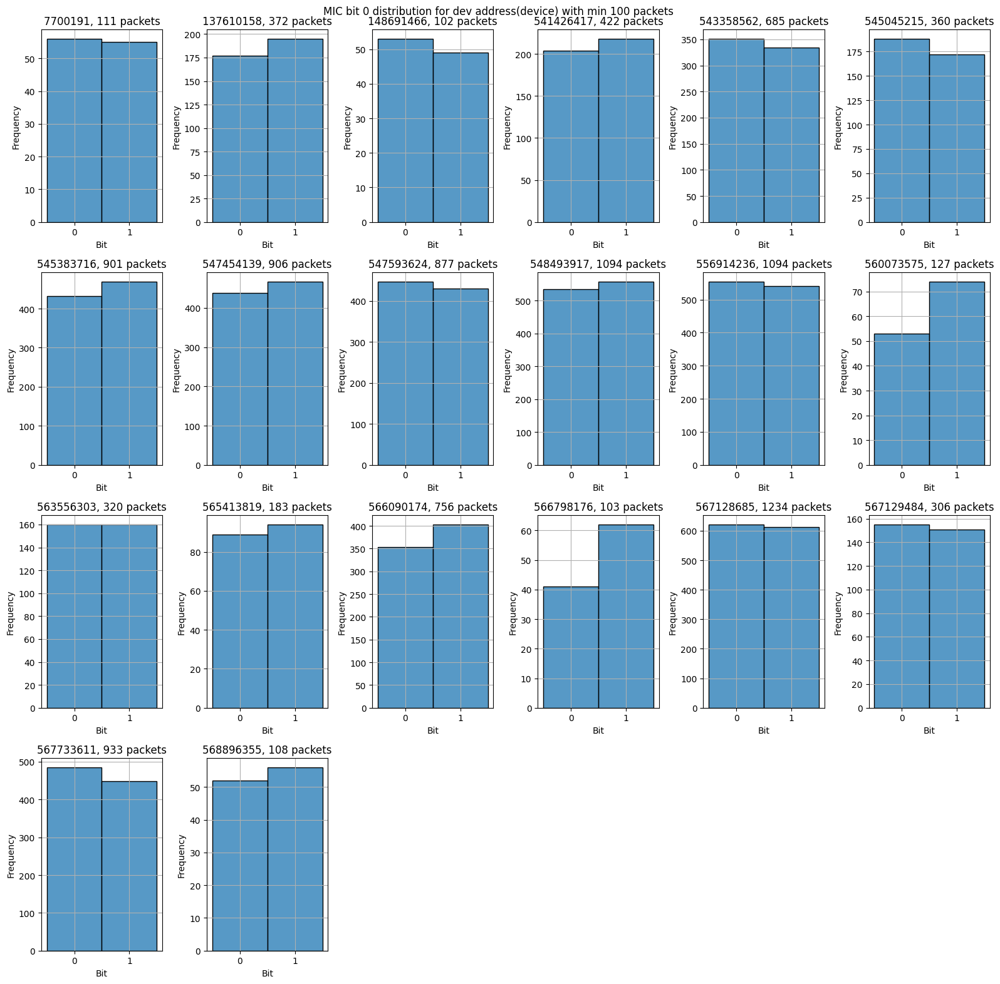

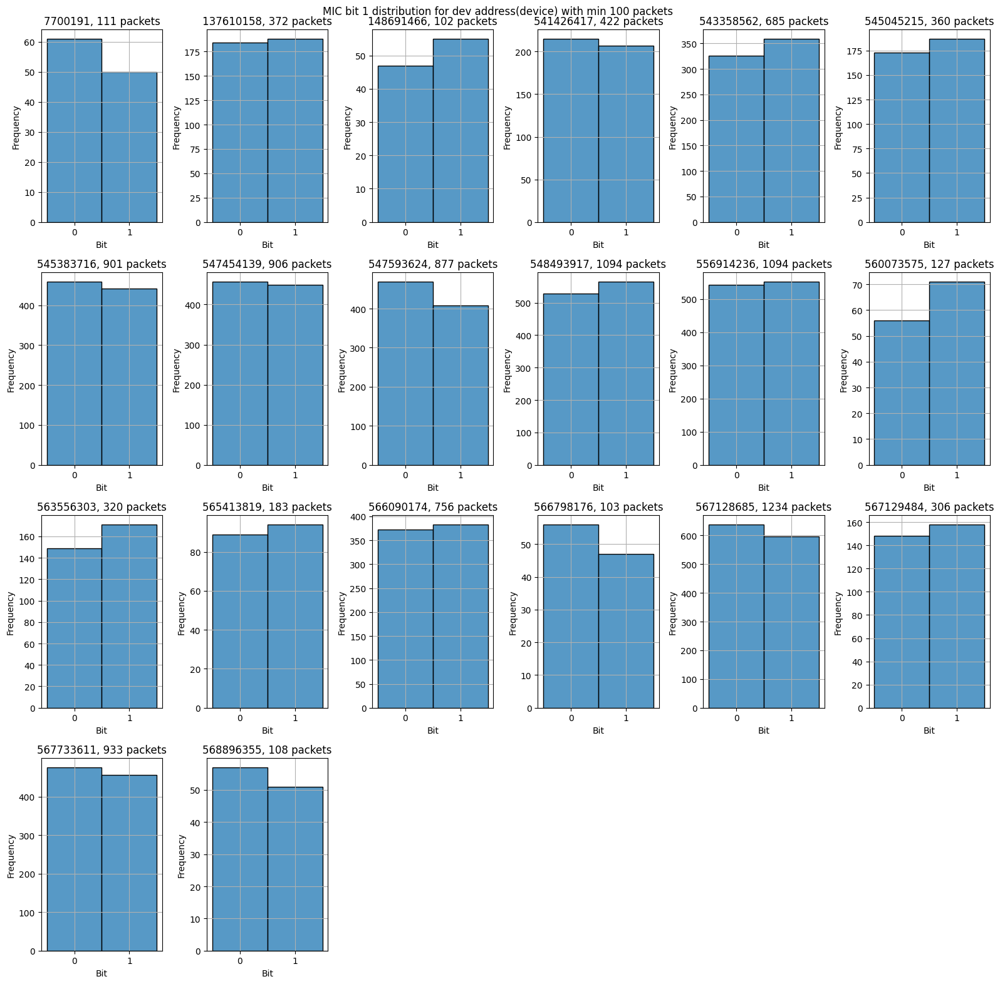

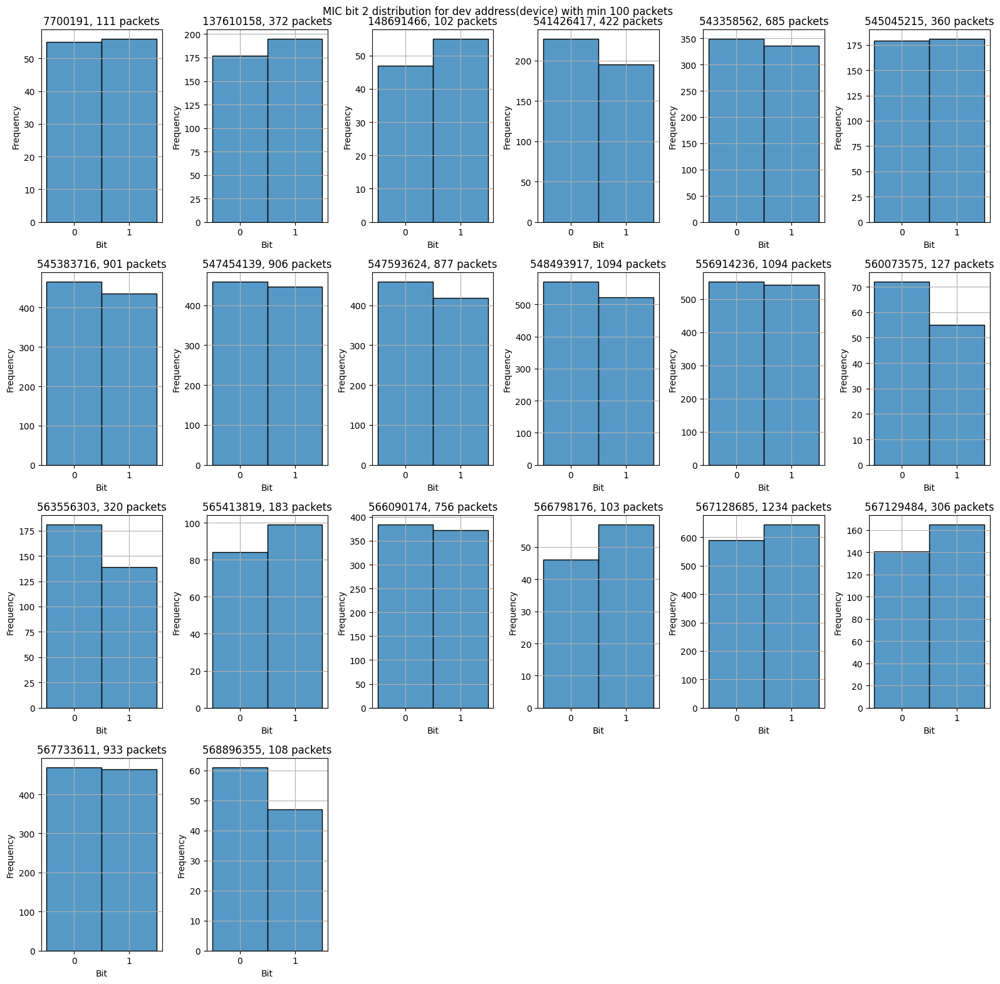

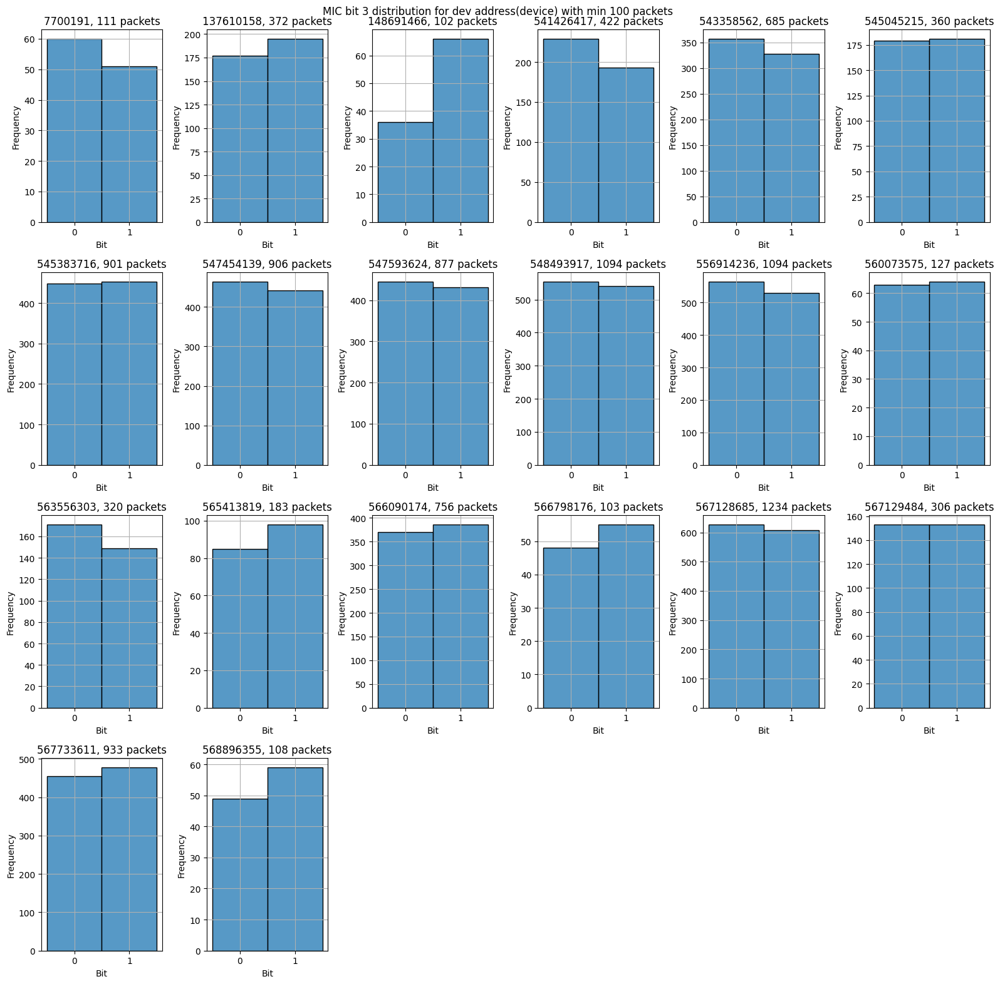

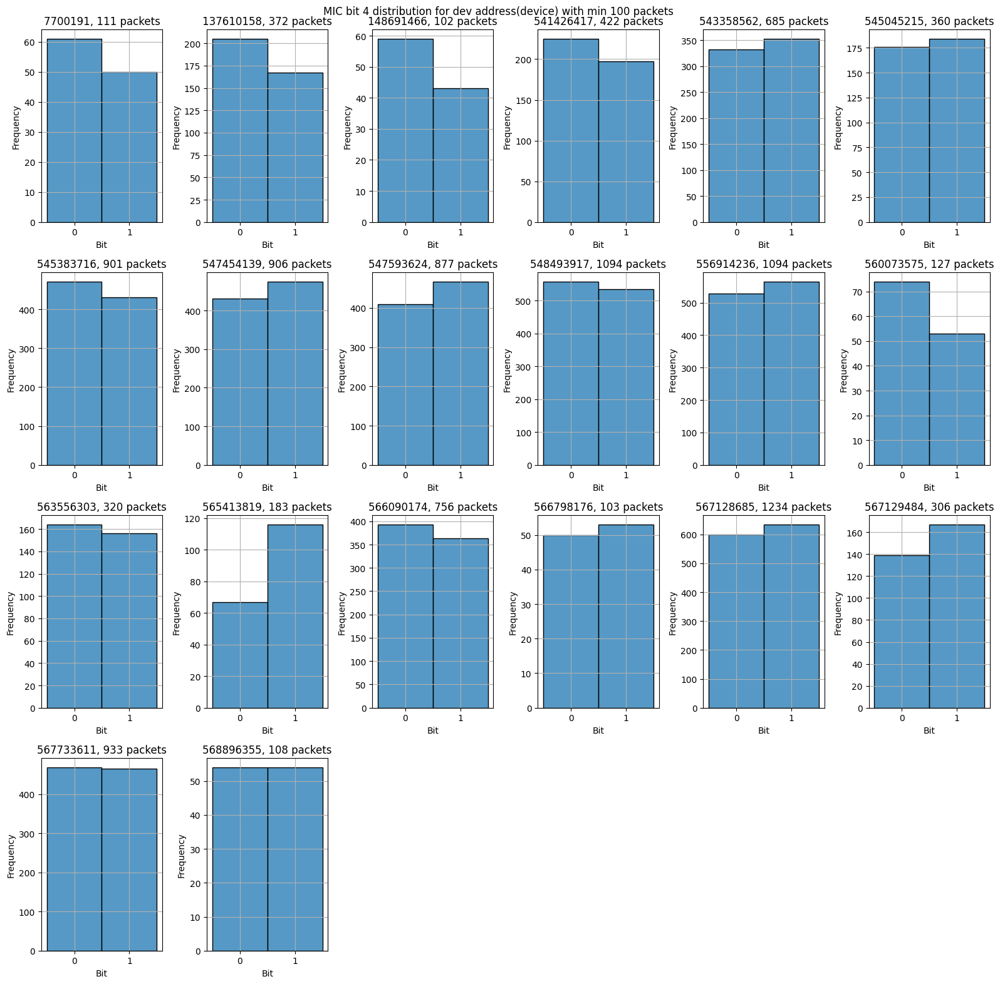

...

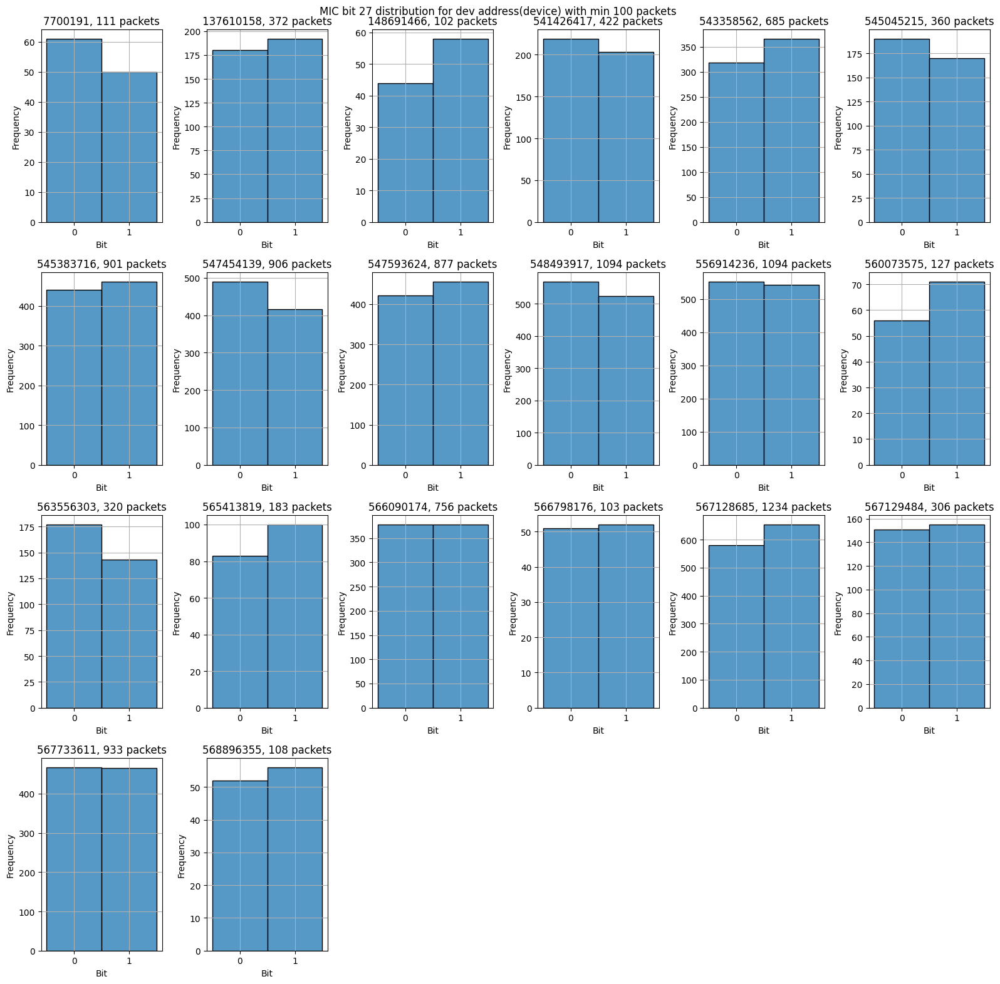

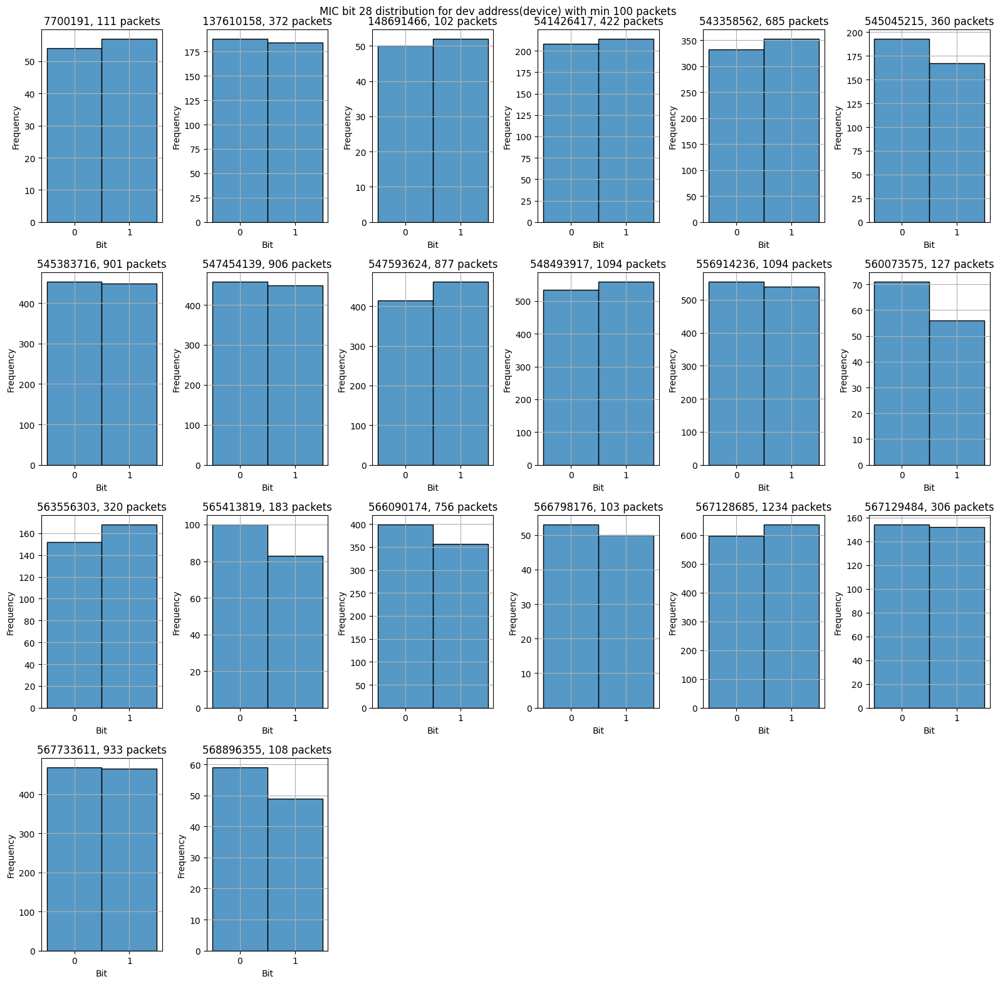

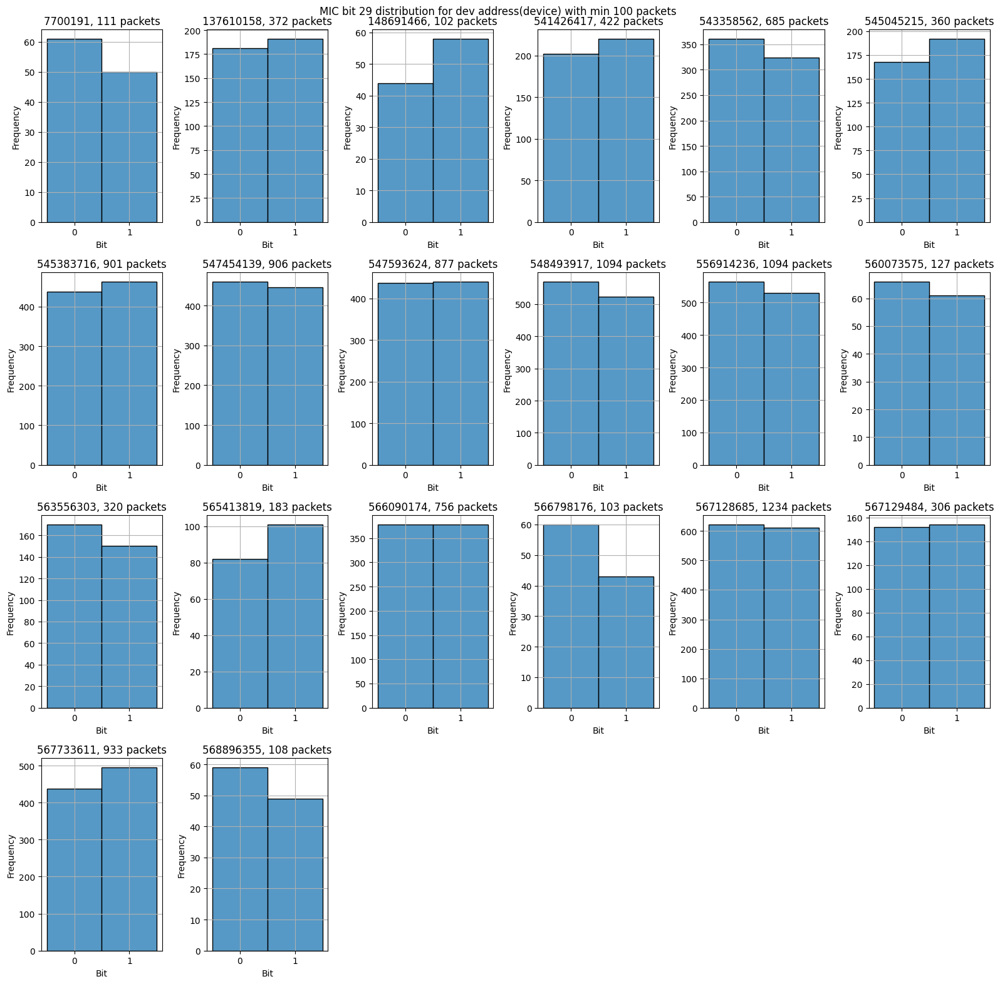

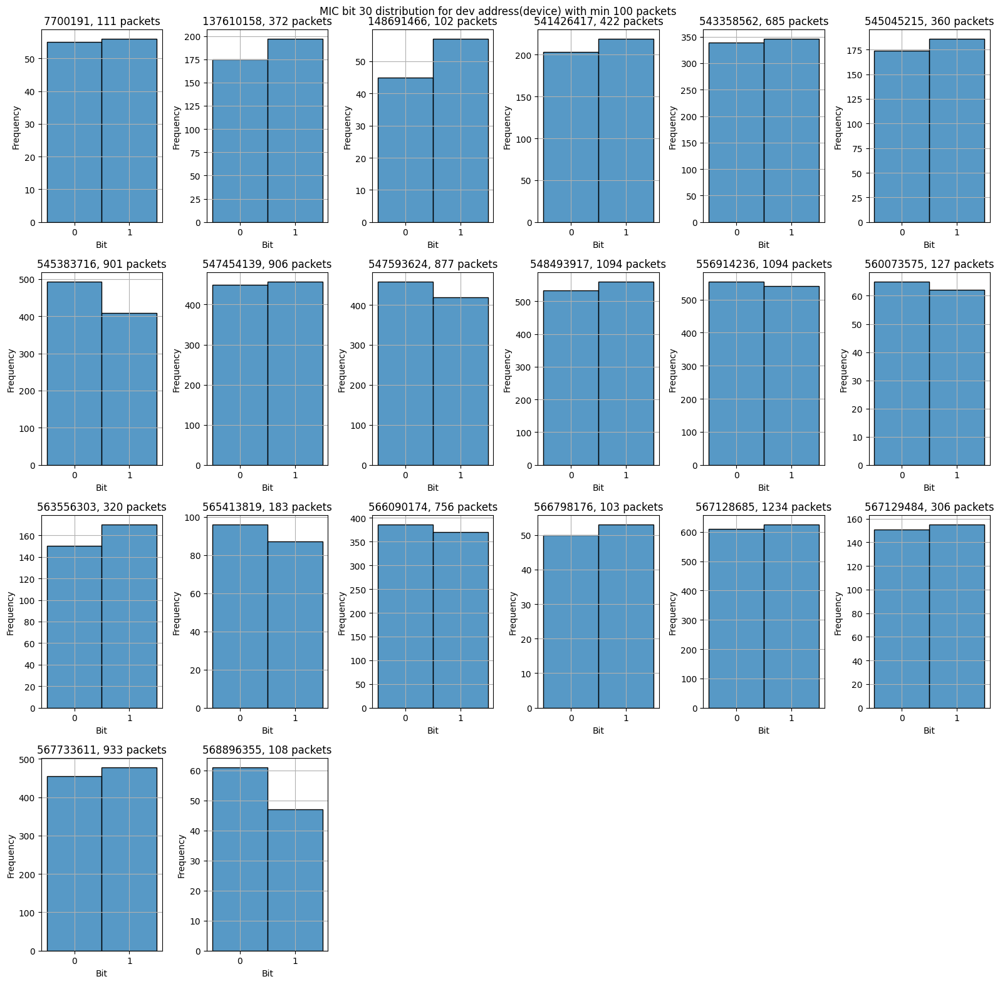

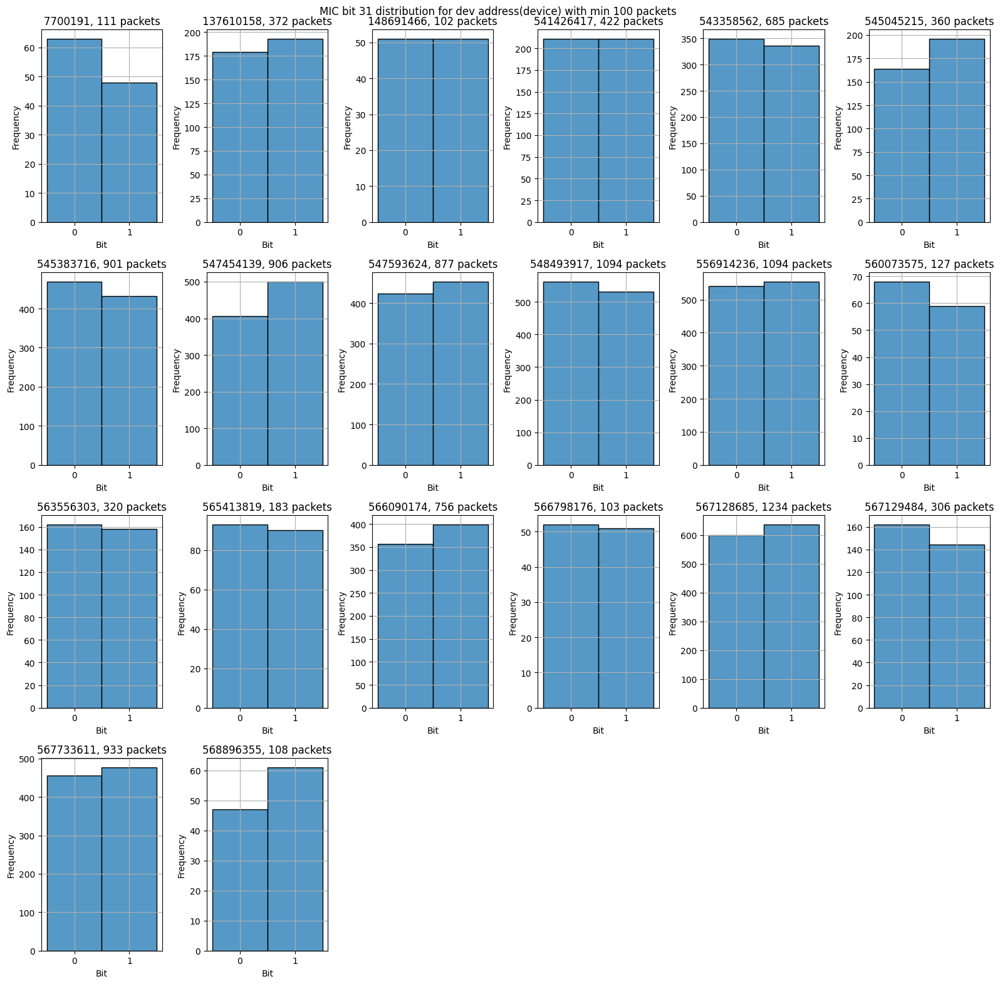

In [14]:
#bit_computed = 0
min_messages = 100
num_cols = 6
filtered_data = {devaddress: mic_list for devaddress, mic_list in mic_by_dev_addr.items() if len(mic_list) > min_messages}
num_devaddresses = len(filtered_data)
for bit_computed in range(32):
    num_rows = -(-num_devaddresses // num_cols)
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, num_rows * 4))
    axes = axes.flatten()
    fig.suptitle(f'MIC bit {bit_computed} distribution for dev address(device) with min {min_messages} packets')

    for idx, (devaddress, mic_list) in enumerate(filtered_data.items()):

        bit_0_list = [extract_bit(mic,bit_computed) for mic in mic_list]
        
        plot_distribution(axes[idx], bit_0_list, devaddress)
    for i in range(len(filtered_data), len(axes)):
            fig.delaxes(axes[i])
    plt.tight_layout(rect=[0, 0, 1, 1])
    plt.show()

# Verify bit entropy

The aim is to generate a crypo random number that should be uniformaly distributed. This will help to selected random bits set to 1 in the collected MICs.
The AND between the CSPRNG generated number and the MIC will keep the bits set to 1. After counting this, it should be a result even or odd and the aim is to repeat this step multiple times on a big set of MIC using the same CSPRNG to evaluate the quality of bit. A good quality result of an average 50% chance even/odd bits set to 1.

In [65]:
# https://docs.python.org/3/library/secrets.html
import secrets # crypto compliant seed generator

# count the bit set to 1
# src: Maxime Augier
def count_bits(n):
    n = (n & 0x55555555) + ((n & 0xAAAAAAAA) >> 1)
    n = (n & 0x33333333) + ((n & 0xCCCCCCCC) >> 2)
    n = (n & 0x0F0F0F0F) + ((n & 0xF0F0F0F0) >> 4)
    n = (n & 0x00FF00FF) + ((n & 0xFF00FF00) >> 8)
    n = (n & 0x0000FFFF) + ((n & 0xFFFF0000) >> 16)
    return n

def count_bits_with_parity(n):
    count = count_bits(n)
    parity = count & 1  # 0 if even, 1 if odd
    return count, parity

def test_bit_quality(mac_list, verbose=False, num_tests=100):
    even_counts = []
    odd_counts = []

    all_xor = []
    for _ in range(num_tests):
        # init
        # a crypto safe random, counters
        random_32bit = secrets.randbits(32)
        even_count =0
        odd_count = 0

        if verbose:
            print(f"Random 32-bit : {random_32bit:032b}")
            print(f"-------------------------------------------------------")

        # must be used to detect pattern
        xor_result = 0

        for mac in mac_list:
            if verbose:
                print(f"MAC:            {mac:032b}")
            
            # extract bit set to 1 selected randomly by the csprng
            and_result = random_32bit & mac
            if verbose:
                print(f"AND:     {and_result:032b}")

            bit_count, parity = count_bits_with_parity(and_result)

            if verbose:
                print(f"bits set to 1:  {bit_count}")
            

            # at this point a good MIC should have the same proportion of even and odd
            if parity == 0:
                even_count += 1
                if verbose:
                    print("Even number of 1 bits")
            else:
                odd_count += 1
                if verbose:
                    print("Odd number of 1 bits")
            
#            xor_result ^= and_result
            

            if verbose:
                print(f"XOR of all AND results: {xor_result:032b}")
                
        # for each test extract the counter of odd and even bit 1
        even_counts.append(even_count)
        odd_counts.append(odd_count)
        #all_xor.append(xor_result)
         
    return even_counts, odd_counts

In [27]:
def extract_all_mic(input_file):
    with open(input_file, 'r') as f:
        data = json.load(f)
    
    values = []
    if isinstance(data, list):
        for item in data:
            if 'content' in item and Field.MIC.value in item['content']:
                values.append(item['content'][Field.MIC.value])
    else:
        if 'content' in data and Field.MIC.value in data['content']:
            values.append(data['content'][Field.MIC.value])
    
    """     values.sort()"""    

    return values

In [58]:
all_mics = extract_all_mic('wss_messages.json')
print(len(all_mics))


28760


# TEST BIT QUALITY --> CURRENT TEST: 10 000 iterations

A set of 10 000 test has been processed on 28k MIC.
Go to section import results to import it

In [69]:
even_counts, odd_counts = test_bit_quality(all_mics, num_tests=10000)

In [70]:
np.savez(f'bit_quality_results', even_counts=even_counts, odd_counts=odd_counts)

# import results

In [ ]:
# to load
#data = np.load('bit_quality_results')
#even_counts = data['even_counts']
#odd_counts = data['odd_counts']
#print("Even counts per test:", even_counts)
#print("Odd counts per test:", odd_counts)

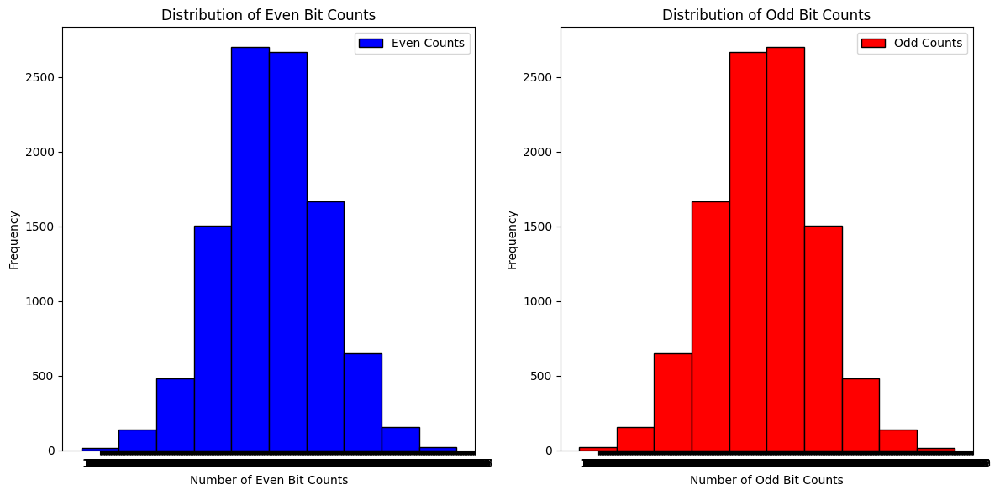

Chi-squared: 0.0, p-value: 1.0


In [68]:

def plot_results(even_counts, odd_counts):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.hist(even_counts, color='blue', label='Even Counts', edgecolor='black', align='left')
    plt.xlabel('Number of Even Bit Counts')
    plt.ylabel('Frequency')
    plt.title('Distribution of Even Bit Counts')
    plt.xticks(range(min(even_counts), max(even_counts) + 1))
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.hist(odd_counts, color='red', label='Odd Counts', edgecolor='black', align='left')
    plt.xlabel('Number of Odd Bit Counts')
    plt.ylabel('Frequency')
    plt.title('Distribution of Odd Bit Counts')
    plt.xticks(range(min(odd_counts), max(odd_counts) + 1))
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_results(even_counts, odd_counts)


from scipy.stats import chi2_contingency

# Exemple de test de chi-carré
def chi_square_test(even_counts, odd_counts):
    #total of each distribution even and odd
    observed = [sum(even_counts), sum(odd_counts)]
    # expected to get 50% for each even/odd
    expected = [len(even_counts) * 0.5, len(odd_counts) * 0.5]
    chi2, p, _, _ = chi2_contingency([observed, expected])
    return chi2, p

chi2, p = chi_square_test(even_counts, odd_counts)
print(f"Chi-squared: {chi2}, p-value: {p}")